In [1]:
%load_ext autoreload
%autoreload 2
!hostname
!pwd
import os, sys
print(sys.executable)
os.environ['CUDA_VISIBLE_DEVICES'] = "4"
os.environ['XLA_PYTHON_CLIENT_PREALLOCATE'] = 'false'

fish-gcp005
/home/akarshkumar0101/nca-alife/src
/home/akarshkumar0101/miniconda3/envs/nca-alife-torch/bin/python


In [2]:
import os, sys, glob, pickle
from functools import partial

import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme()

from tqdm.auto import tqdm
from einops import rearrange, reduce, repeat

In [3]:
import experiment_utils
import util

# Create Experiment

In [4]:
! rm -rf ./experiments
! mkdir -p ./experiments

In [363]:
cfg_default = dict(
    seed=0, save_dir=None, dtype='float32', device='cuda:0',
    
    img_size=64, d_state=16, perception='fullconv', kernel_size=3,
    init_state="point", padding_mode="circular", dt=0.01, dropout=0.1, # changed dropout and initial state
    
    prompts="a biological cell;a single fat cat", spatial_scales="1.", clip_model="clip-vit-base-patch32",
    coef_alignment=1., coef_temporal_softmax=0.,
    
    rollout_steps=256, bptt_steps=16, pool_size=256, # changed the rollout steps and the pool size
    bs=8, lr=3e-4, n_iters=100000, clip_grad_norm=1.
)

seeds = np.arange(3)
prompts_sweep = [
    "a single biological cell,two biological cells",
    "a single biological cell,a big biological cell expanding,a biological cell undergoing cell division,two biological cells",
    "a biological cell,a cell splitting into two,multiple biological cells,a diverse ecosystem of cells",
    "a single bacterium under the microscope,two bacteria,four bacteria,eight bacteria",
]
coef_temporal_softmax_sweep = [0., 0.01, 0.03, 0.1, 0.3]

cfgs = []
for seed in seeds:
    for i1, prompts in enumerate(prompts_sweep):
        for coef_temporal_softmax in coef_temporal_softmax_sweep:
            cfg = cfg_default.copy()
            cfg.update(seed=seed, prompts=prompts, coef_temporal_softmax=coef_temporal_softmax)
            cfg.update(save_dir=f"/home/akarshkumar0101/nca-alife-data/nca_temporal_1/{seed}_{i1}_{coef_temporal_softmax}")
            cfgs.append(cfg)
    
print(len(cfgs))

60


In [364]:
commands = experiment_utils.create_commands(cfgs, prefix='python train_nca_temporal_emergence.py', out_file='./experiments/main.sh')
print('\n'.join(commands[:3]), '\n...')
print(len(commands), 'commands')

python train_nca_temporal_emergence.py --seed=0 --save_dir="/home/akarshkumar0101/nca-alife-data/nca_temporal_1/0_0_0.0"  --dtype="float32" --device="cuda:0" --img_size=64 --d_state=16 --perception="fullconv" --kernel_size=3 --init_state="point" --padding_mode="circular" --dt=0.01 --dropout=0.1 --prompts="a single biological cell,two biological cells"                                                                            --spatial_scales="1." --clip_model="clip-vit-base-patch32" --coef_alignment=1.0 --coef_temporal_softmax=0.0  --rollout_steps=256 --bptt_steps=16 --pool_size=256 --bs=8 --lr=0.0003 --n_iters=100000 --clip_grad_norm=1.0
python train_nca_temporal_emergence.py --seed=0 --save_dir="/home/akarshkumar0101/nca-alife-data/nca_temporal_1/0_0_0.01" --dtype="float32" --device="cuda:0" --img_size=64 --d_state=16 --perception="fullconv" --kernel_size=3 --init_state="point" --padding_mode="circular" --dt=0.01 --dropout=0.1 --prompts="a single biological cell,two biological cells"

# Visualize Results

In [365]:
import torch
from torchvision import transforms
from torchvision.transforms import InterpolationMode

In [366]:
import copy
df = []
for cfg in cfgs:
    save_dir = cfg['save_dir']
    data = util.load_pkl(save_dir, 'data')
    dfi = copy.copy(cfg)
    df.append(dfi)
df = pd.DataFrame(df)

  0%|          | 0/5 [00:00<?, ?it/s]

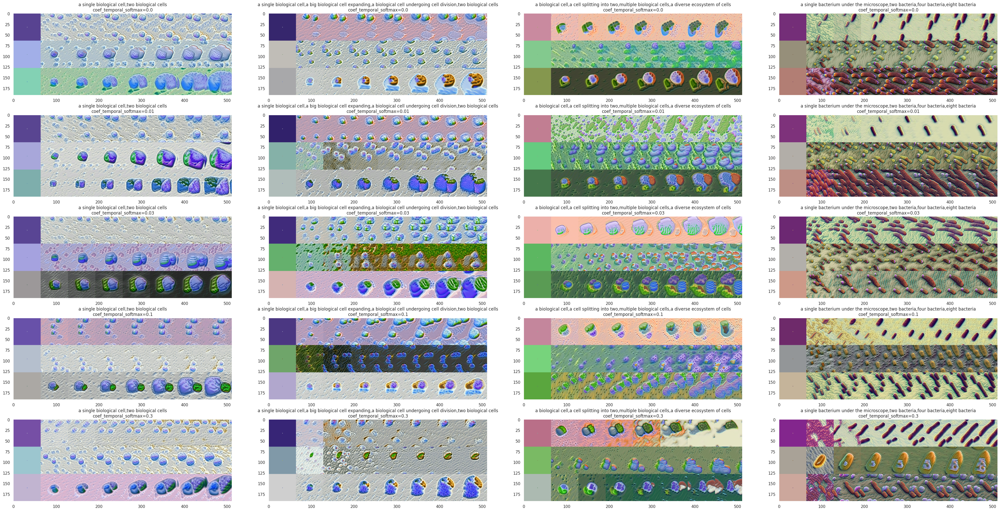

In [389]:
plt.figure(figsize=(40, 20))
iplt = 0
for coef_temporal_softmax in tqdm(coef_temporal_softmax_sweep):
    for i1, prompts in enumerate(prompts_sweep):
        vid = []
        for seed in seeds:
            save_dir=f"/home/akarshkumar0101/nca-alife-data/nca_temporal_1/{seed}_{i1}_{coef_temporal_softmax}"
            vid.append(util.load_pkl(save_dir, "vid").astype(np.uint8))
        vid = np.stack(vid)

        iplt += 1
        plt.subplot(5, 4, iplt)
        plt.imshow(rearrange(vid[:, ::vid.shape[1]//8], "R C H W D -> (R H) (C W) D"))
        plt.grid(False)
        plt.title(f"{prompts}\n{coef_temporal_softmax=}")
plt.tight_layout()
plt.show()